In [1]:
import matplotlib.pyplot as plt
import numpy as np
import rioxarray as rxr

In [2]:

from osgeo import gdal
import glob

# Utility to plot a 2D array
def plotdata(GDALfilename, band=1,
             title=None,colormap='gray',
             aspect=1, background=None,
             datamin=None, datamax=None,
             interpolation='nearest',
             nodata = None,
             draw_colorbar=True, colorbar_orientation="horizontal"):
    
    # Read the data into an array
    ds = gdal.Open(GDALfilename, gdal.GA_ReadOnly)
    data = ds.GetRasterBand(band).ReadAsArray()
    transform = ds.GetGeoTransform()
    ds = None
    
    try:
        if nodata is not None:
            data[data == nodata] = np.nan
    except:
        pass
        
    # getting the min max of the axes
    firstx = transform[0]
    firsty = transform[3]
    deltay = transform[5]
    deltax = transform[1]
    lastx = firstx+data.shape[1]*deltax
    lasty = firsty+data.shape[0]*deltay
    ymin = np.min([lasty,firsty])
    ymax = np.max([lasty,firsty])
    xmin = np.min([lastx,firstx])
    xmax = np.max([lastx,firstx])

    # put all zero values to nan and do not plot nan
    if background is None:
        try:
            data[data==0]=np.nan
        except:
            pass
    
    fig = plt.figure(figsize=(18, 16))
    ax = fig.add_subplot(111)
    cax = ax.imshow(data, vmin = datamin, vmax=datamax,
                    cmap=colormap, extent=[xmin,xmax,ymin,ymax],
                    interpolation=interpolation)
    ax.set_title(title)
    if draw_colorbar is not None:
        cbar = fig.colorbar(cax,orientation=colorbar_orientation)
    ax.set_aspect(aspect)    
    plt.show()
    
    # clearing the data
    data = None

# Utility to plot interferograms
def plotcomplexdata(GDALfilename,
                    title=None, aspect=1,
                    datamin=None, datamax=None,
                    interpolation='nearest',
                    draw_colorbar=None, colorbar_orientation="horizontal"):
    # Load the data into numpy array
    ds = gdal.Open(GDALfilename, gdal.GA_ReadOnly)
    slc = ds.GetRasterBand(1).ReadAsArray()
    transform = ds.GetGeoTransform()
    ds = None
    
    # getting the min max of the axes
    firstx = transform[0]
    firsty = transform[3]
    deltay = transform[5]
    deltax = transform[1]
    lastx = firstx+slc.shape[1]*deltax
    lasty = firsty+slc.shape[0]*deltay
    ymin = np.min([lasty,firsty])
    ymax = np.max([lasty,firsty])
    xmin = np.min([lastx,firstx])
    xmax = np.max([lastx,firstx])

    # put all zero values to nan and do not plot nan
    try:
        slc[slc==0]=np.nan
    except:
        pass

    
    fig = plt.figure(figsize=(18, 16))
    ax = fig.add_subplot(1,2,1)
    cax1=ax.imshow(np.abs(slc), vmin = datamin, vmax=datamax,
                   cmap='gray', extent=[xmin,xmax,ymin,ymax],
                   interpolation=interpolation)
    ax.set_title(title + " (amplitude)")
    if draw_colorbar is not None:
        cbar1 = fig.colorbar(cax1,orientation=colorbar_orientation)
    ax.set_aspect(aspect)

    ax = fig.add_subplot(1,2,2)
    cax2 =ax.imshow(np.angle(slc), cmap='rainbow',
                    vmin=-np.pi, vmax=np.pi,
                    extent=[xmin,xmax,ymin,ymax],
                    interpolation=interpolation)
    ax.set_title(title + " (phase [rad])")
    if draw_colorbar is not None:
        cbar2 = fig.colorbar(cax2, orientation=colorbar_orientation)
    ax.set_aspect(aspect)
    plt.show()
    
    # clearing the data
    slc = None

# Utility to plot multiple similar arrays
def plotstackdata(GDALfilename_wildcard, band=1,
                  title=None, colormap='gray',
                  aspect=1, datamin=None, datamax=None,
                  interpolation='nearest',
                  draw_colorbar=True, colorbar_orientation="horizontal"):
    # get a list of all files matching the filename wildcard criteria
    GDALfilenames = glob.glob(GDALfilename_wildcard)
    
    # initialize empty numpy array
    data = None
    for GDALfilename in GDALfilenames:
        ds = gdal.Open(GDALfilename, gdal.GA_ReadOnly)
        data_temp = ds.GetRasterBand(band).ReadAsArray()   
        ds = None
        
        if data is None:
            data = data_temp
        else:
            data = np.vstack((data,data_temp))

    # put all zero values to nan and do not plot nan
    try:
        data[data==0]=np.nan
    except:
        pass            
            
    fig = plt.figure(figsize=(18, 16))
    ax = fig.add_subplot(111)
    cax = ax.imshow(data, vmin = datamin, vmax=datamax,
                    cmap=colormap, interpolation=interpolation)
    ax.set_title(title)
    if draw_colorbar is not None:
        cbar = fig.colorbar(cax,orientation=colorbar_orientation)
    ax.set_aspect(aspect)    
    plt.show() 

    # clearing the data
    data = None

# Utility to plot multiple simple complex arrays
def plotstackcomplexdata(GDALfilename_wildcard,
                         title=None, aspect=1,
                         datamin=None, datamax=None,
                         interpolation='nearest',
                         draw_colorbar=True, colorbar_orientation="horizontal"):
    # get a list of all files matching the filename wildcard criteria
    GDALfilenames = glob.glob(GDALfilename_wildcard)
    print(GDALfilenames)
    # initialize empty numpy array
    data = None
    for GDALfilename in GDALfilenames:
        ds = gdal.Open(GDALfilename, gdal.GA_ReadOnly)
        data_temp = ds.GetRasterBand(1).ReadAsArray()
        ds = None
        
        if data is None:
            data = data_temp
        else:
            data = np.vstack((data,data_temp))

    # put all zero values to nan and do not plot nan
    try:
        data[data==0]=np.nan
    except:
        pass              
            
    fig = plt.figure(figsize=(18, 16))
    ax = fig.add_subplot(1,2,1)
    cax1=ax.imshow(np.abs(data), vmin=datamin, vmax=datamax,
                   cmap='gray', interpolation='nearest')
    ax.set_title(title + " (amplitude)")
    if draw_colorbar is not None:
        cbar1 = fig.colorbar(cax1,orientation=colorbar_orientation)
    ax.set_aspect(aspect)

    ax = fig.add_subplot(1,2,2)
    cax2 =ax.imshow(np.angle(data), cmap='rainbow',
                            interpolation='nearest')
    ax.set_title(title + " (phase [rad])")
    if draw_colorbar is not None:
        cbar2 = fig.colorbar(cax2,orientation=colorbar_orientation)
    ax.set_aspect(aspect)
    plt.show() 
    
    # clearing the data
    data = None
    

In [3]:
import isce
import logging
import os  

root_logger = logging.getLogger()
root_logger.setLevel('WARNING')

# Set Environment variables so that you can call ISCE2 Apps from the command line
os.environ['ISCE_HOME'] = os.path.dirname(isce.__file__)
os.environ['PATH']+='{ISCE_HOME}/bin:{ISCE_HOME}/applications'.format(**os.environ)

print('ISCE2 Version:', isce.__version__)

Using default ISCE Path: /data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/isce
ISCE2 Version: 2.6.3


In [4]:
os.chdir("/data/tapas/pearse/malawi/sentinel1/insar_southern_malawi")
!pwd

/data/tapas/pearse/malawi/sentinel1/insar_southern_malawi


In [4]:
os.chdir("/data/tapas/pearse/malawi/SSM/malawi_InSAR_SSM_5km_20230101_20240531/malawi_InSAR_SSM_5km_20230101_20240531/INSAR4SM_datasets")
!pwd

/data/tapas/pearse/malawi/SSM/malawi_InSAR_SSM_5km_20230101_20240531/malawi_InSAR_SSM_5km_20230101_20240531/INSAR4SM_datasets


/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore


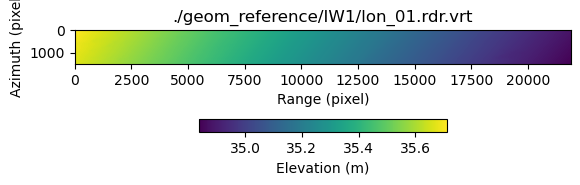

In [7]:
path = './geom_reference/IW1/lon_01.rdr.vrt'
da = rxr.open_rasterio(path, parse_coordinates=False)

plt.imshow(da.sel(band=1), aspect=1)
plt.title(path)
plt.xlabel('Range (pixel)')
plt.ylabel('Azimuth (pixel')

cb = plt.colorbar(orientation='horizontal', shrink=0.5);
cb.set_label('Elevation (m)')

/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore


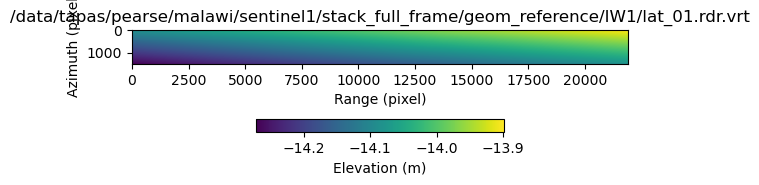

In [22]:
path ="/data/tapas/pearse/malawi/sentinel1/stack_full_frame/geom_reference/IW1/lat_01.rdr.vrt"
da = rxr.open_rasterio(path, parse_coordinates=False)

plt.imshow(da.sel(band=1), aspect=1)
plt.title(path)
plt.xlabel('Range (pixel)')
plt.ylabel('Azimuth (pixel')

cb = plt.colorbar(orientation='horizontal', shrink=0.5);
cb.set_label('Elevation (m)')

In [25]:
da.values.min(), da.values.max()(35.1398, -15.0851, 35.4723, -14.7249)

(-14.271919336690438, -13.89901225146194)

In [88]:
from pathlib import Path
from shapely import Polygon, MultiPolygon

In [89]:
burst_edges = []
for IW in ["IW1", "IW2", "IW3"]:
    
    burst_lats = sorted(Path(f"/data/tapas/pearse/malawi/sentinel1/stack_full_frame/geom_reference/{IW}/").glob("lat_*rdr.vrt"))
    burst_lons = sorted(Path(f"/data/tapas/pearse/malawi/sentinel1/stack_full_frame/geom_reference/{IW}/").glob("lon_*rdr.vrt"))

    for blat, blon in zip(burst_lats, burst_lons):
        blat_da = rxr.open_rasterio(blat, parse_coordinates=False)
        blon_da = rxr.open_rasterio(blon, parse_coordinates=False)
        # Counter clockwise from top left
        burst_edge = [
            (blon_da.values.min(), blat_da.values.max()),
            (blon_da.values.min(), blat_da.values.min()),
            (blon_da.values.max(), blat_da.values.min()),
            (blon_da.values.max(), blat_da.values.max()),
            (blon_da.values.min(), blat_da.values.max()),]
        burst_poly = Polygon(burst_edge)
        burst_edges.append(burst_poly)
footprint = MultiPolygon(burst_edges)

/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset

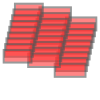

In [93]:
footprint

In [154]:
import geopandas as gpd
AOI_WGS84 = "/data/tapas/pearse/malawi/sentinel1/aoi/geoBoundaries-MWI-ADM0.geojson"
polygon_WGS84 = gpd.read_file(AOI_WGS84).geometry.iloc[0]
# if type(polygon_WGS84) == shapely.geometry.multipolygon.MultiPolygon:
#     polygon_WGS84 = polygon_WGS84.geoms[2]

In [138]:
for geom in footprint.geoms:

    print(geom & polygon_WGS84)

MULTIPOLYGON (((34.95726307210769 -14.271919336690438, 34.95726307210769 -14.166013072107695, 34.95775 -14.1665, 34.9585 -14.166, 34.962 -14.16725, 34.9625 -14.168, 34.964 -14.16875, 34.969 -14.1695, 34.9725 -14.16925, 34.975 -14.1675, 34.976 -14.169, 34.9775 -14.16925, 34.9865 -14.16825, 34.9875 -14.16575, 34.99075 -14.16425, 34.9925 -14.16275, 34.99375 -14.16275, 34.995 -14.16175, 34.99675 -14.16175, 35.00125 -14.16375, 35.00025 -14.16425, 34.9995 -14.165, 34.9985 -14.16825, 34.99975 -14.177, 35.00175 -14.18, 35.00325 -14.18125, 35.006 -14.182, 35.0065 -14.18275, 35.0095 -14.18325, 35.01525 -14.18325, 35.02 -14.1825, 35.029 -14.17975, 35.03725 -14.17575, 35.03581429999997 -14.181014299999976, 35.035 -14.184, 35.0355 -14.18625, 35.0365 -14.1875, 35.0375 -14.1925, 35.03875 -14.19375, 35.03975 -14.1935, 35.04075 -14.19525, 35.04 -14.196, 35.04 -14.1985, 35.04025 -14.2, 35.04125 -14.2015, 35.0425 -14.2005, 35.04338590000001 -14.2002047, 35.044 -14.2, 35.046 -14.20175, 35.047 -14.2035, 35

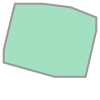

In [143]:
footprint.convex_hull

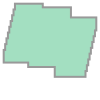

In [152]:
geom_union = footprint.geoms[0]
for i in range(1, len(footprint.geoms)):
    geom_union = geom_union.union(footprint.geoms[i])
geom_union



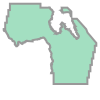

In [155]:
geom_union & polygon_WGS84

In [86]:
np.array(burst_edges)[0]

array([[ 34.95726307, -14.27191934,  35.82715848, -13.89901225],
       [ 34.91693844, -14.4385411 ,  35.78868374, -14.06537954],
       [ 34.87661707, -14.60460957,  35.75050973, -14.23118039],
       [ 34.83618675, -14.77097127,  35.71146633, -14.39700547],
       [ 34.79588051, -14.93750996,  35.67168049, -14.56307282],
       [ 34.75495026, -15.10378829,  35.63445017, -14.72894529],
       [ 34.71267275, -15.2700889 ,  35.59604303, -14.8944263 ],
       [ 34.67277018, -15.43624771,  35.55695507, -15.06014651],
       [ 34.63541464, -15.60245771,  35.51740706, -15.22554327]])

In [87]:
np.array(burst_edges)[1]

array([[ 34.19762142, -13.99242573,  35.09938525, -13.60897628],
       [ 34.15500997, -14.15856272,  35.06083165, -13.77447176],
       [ 34.11322023, -14.32472288,  35.02143897, -13.93974434],
       [ 34.07263129, -14.49051796,  34.98069932, -14.10555611],
       [ 34.03175569, -14.65630475,  34.93948478, -14.27103109],
       [ 33.99306779, -14.82247045,  34.90000196, -14.43668948],
       [ 33.95414955, -14.98834786,  34.86097712, -14.60266923],
       [ 33.91521537, -15.15444485,  34.82093978, -14.76884076],
       [ 33.87346314, -15.3204277 ,  34.78199655, -14.93499124]])

In [38]:
edges = []
for IW in ["IW1" ,"IW2", "IW3"]:
    lat_top = f"/data/tapas/pearse/malawi/sentinel1/stack_full_frame/geom_reference/{IW}/lat_01.rdr.vrt"
    lat_bot = f"/data/tapas/pearse/malawi/sentinel1/stack_full_frame/geom_reference/{IW}/lat_09.rdr.vrt"
    lon_top = f"/data/tapas/pearse/malawi/sentinel1/stack_full_frame/geom_reference/{IW}/lon_01.rdr.vrt"
    lon_bot = f"/data/tapas/pearse/malawi/sentinel1/stack_full_frame/geom_reference/{IW}/lon_09.rdr.vrt"

    lat_da_top = rxr.open_rasterio(lat_top, parse_coordinates=False)
    lat_da_bot = rxr.open_rasterio(lat_bot, parse_coordinates=False)
    lon_da_top = rxr.open_rasterio(lon_top, parse_coordinates=False)
    lon_da_bot = rxr.open_rasterio(lon_bot, parse_coordinates=False)
    edges.append([(lon_da_top.values.min(), lat_da_top.values.max()),
       ( lon_da_top.values.max(), lat_da_top.values.max()),
        (lon_da_top.values.max(), lat_da_top.values.min()),
        (lon_da_top.values.min(), lat_da_top.values.min()),])
    

/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset

In [43]:
np.min(np.array(edges).reshape(-1,2), axis=0), np.max(np.array(edges).reshape(-1,2), axis=0)

(array([ 33.49400806, -14.27191934]), array([ 35.82715848, -13.50488602]))

In [44]:
np.array(edges).reshape(-1,2)

array([[ 34.95726307, -13.89901225],
       [ 35.82715848, -13.89901225],
       [ 35.82715848, -14.27191934],
       [ 34.95726307, -14.27191934],
       [ 34.19762142, -13.60897628],
       [ 35.09938525, -13.60897628],
       [ 35.09938525, -13.99242573],
       [ 34.19762142, -13.99242573],
       [ 33.49400806, -13.50488602],
       [ 34.29209213, -13.50488602],
       [ 34.29209213, -13.8668121 ],
       [ 33.49400806, -13.8668121 ]])

In [156]:
latFile = "/data/tapas/pearse/malawi/sentinel1/stack_full_frame/merged/geom_reference/lat.rdr.full.vrt"
lonFile = "/data/tapas/pearse/malawi/sentinel1/stack_full_frame/merged/geom_reference/lon.rdr.full.vrt"
lat_data = gdal.Open(latFile).ReadAsArray()
lon_data = gdal.Open(lonFile).ReadAsArray()

In [12]:
lat_data.min(), lat_data[lat_data!=0].max(), lon_data[lon_data!=0].min(),lon_data.max()


(-15.602457714134458,
 -13.504886016788177,
 33.17134746860198,
 35.827158478366414)

In [157]:
import geopandas as gpd
AOI_WGS84 = "/data/tapas/pearse/malawi/sentinel1/aoi/Malawi_frame_640_intersection1.geojson"
polygon_WGS84 = gpd.read_file(AOI_WGS84).geometry.iloc[0]

In [158]:
import shapely
if type(polygon_WGS84) == shapely.geometry.multipolygon.MultiPolygon:
    polygon_WGS84 = polygon_WGS84.geoms[0]

assert type(polygon_WGS84) == shapely.geometry.polygon.Polygon

lons, lats = polygon_WGS84.exterior.coords.xy

# we drop the last element because it is the same with the first one.
lons = np.array(lons)[:-1]
lats = np.array(lats)[:-1]
assert lons.shape == lats.shape

SAR_Xs = np.zeros_like(lons).astype(np.int32)
SAR_Ys = np.zeros_like(lons).astype(np.int32)

In [166]:
polygon_WGS84.bounds

(33.356605, -15.577458, 35.72551, -13.529886)

In [170]:
len(lats)

4371

In [29]:
lat_data[lat_data != 0] = np.NaN

In [176]:
lat_data.shape, lats.shape

((13112, 68245), (4371,))

In [172]:
for p in range(len(lats)):
    lat_p = lats[p]
    lon_p = lons[p]
    dist = 0.001
    # lat_mask = np.abs(lat_data-lat_p) < dist
    # lon_mask = np.abs(lon_data-lon_p) < dist

    # mask = lat_mask*lon_mask
    print(p,lat_p, lon_p )



0 -14.192092 33.356605
1 -14.192092 33.395833
2 -14.026742 33.395833
3 -14.026742 33.437354
4 -13.861126 33.437354
5 -13.861126 33.477937
6 -13.695504 33.477937
7 -13.695504 33.519008
8 -13.529886 33.519008
9 -13.529886 34.267092
10 -13.633976 34.267092
11 -13.633976 34.548321
12 -13.63525 34.549
13 -13.63625 34.55075
14 -13.6375 34.5515
15 -13.64 34.5545
16 -13.64075 34.5545
17 -13.64175 34.556
18 -13.6425 34.556
19 -13.64525 34.5585
20 -13.646 34.5585
21 -13.64775 34.55975
22 -13.64925 34.56225
23 -13.6515 34.5645
24 -13.6525 34.56625
25 -13.6525 34.56725
26 -13.65325 34.5675
27 -13.653 34.56875
28 -13.65375 34.56975
29 -13.65425 34.57175
30 -13.65525 34.5725
31 -13.6565 34.575
32 -13.65675 34.57675
33 -13.658 34.578
34 -13.65875 34.58075
35 -13.665 34.5875
36 -13.665489 34.589822
37 -13.666105 34.591187
38 -13.66675 34.5925
39 -13.66675 34.594
40 -13.66925 34.59625
41 -13.67025 34.596
42 -13.6725 34.59725
43 -13.6775 34.5975
44 -13.678593 34.596775
45 -13.6835 34.59625
46 -13.685 34

In [165]:
lat_p, lon_p

(-14.192092, 33.356605)

In [169]:
mask.nonzero()[0].shape[0]

1029

In [50]:

srcDS = gdal.OpenEx('/data/tapas/pearse/malawi/sentinel1/aoi/sentinel-1a-acquisition-segment-2023/S1A_MP_USER_20230109T160000_20230129T180000.kml')
kml = srcDS.ReadAsArray()

In [53]:
srcDS

0

In [22]:
np.abs(-15.602457714134458 - lat_p), np.abs(-13.504886016788177 -lat_p)

(2.2024577141344572, 0.10488601678817666)

In [23]:
lat_data

array([[  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [-15.60221091, -15.60220069, -15.60219055, ...,   0.        ,
          0.        ,   0.        ],
       [-15.60233461, -15.60232454, -15.60231465, ...,   0.        ,
          0.        ,   0.        ],
       [-15.60245771, -15.60244788, -15.60243842, ...,   0.        ,
          0.        ,   0.        ]])

896

807

In [27]:
da.values[da.values!=0].min()

33.17134746860198

In [28]:
da.max()

<xarray.DataArray ()> Size: 8B
array(35.82715848)
Coordinates:
    spatial_ref  int64 8B 0

<xarray.DataArray (band: 1, y: 13112, x: 68245)> Size: 7GB
array([[[  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        ...,
        [-15.60221091, -15.60220069, -15.60219055, ...,   0.        ,
           0.        ,   0.        ],
        [-15.60233461, -15.60232454, -15.60231465, ...,   0.        ,
           0.        ,   0.        ],
        [-15.60245771, -15.60244788, -15.60243842, ...,   0.        ,
           0.        ,   0.        ]]])
Coordinates:
  * band         (band) int64 8B 1
    spatial_ref  int64 8B 0
Dimensions without coordinates: y, x
Attributes:
    _FillValue:    0.0
    scale_factor:  1.0
    add_offset:    0.0

/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/osgeo/gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


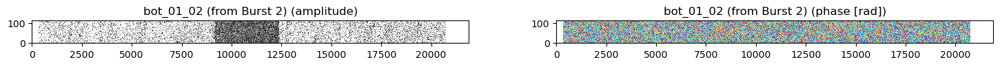

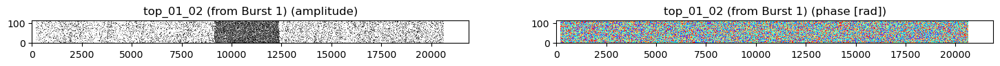

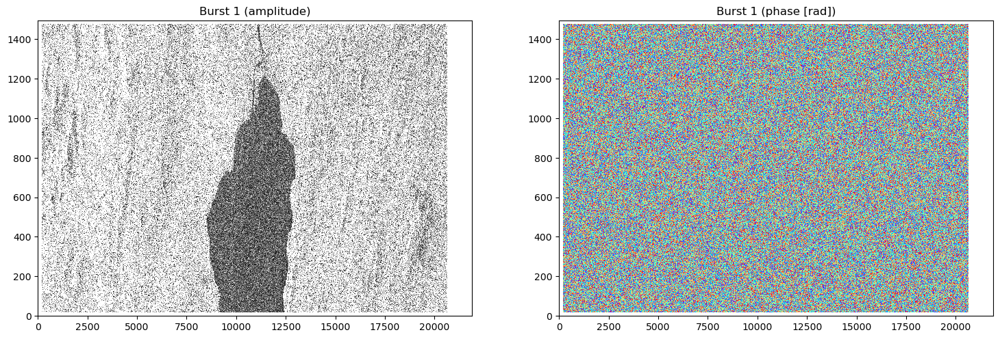

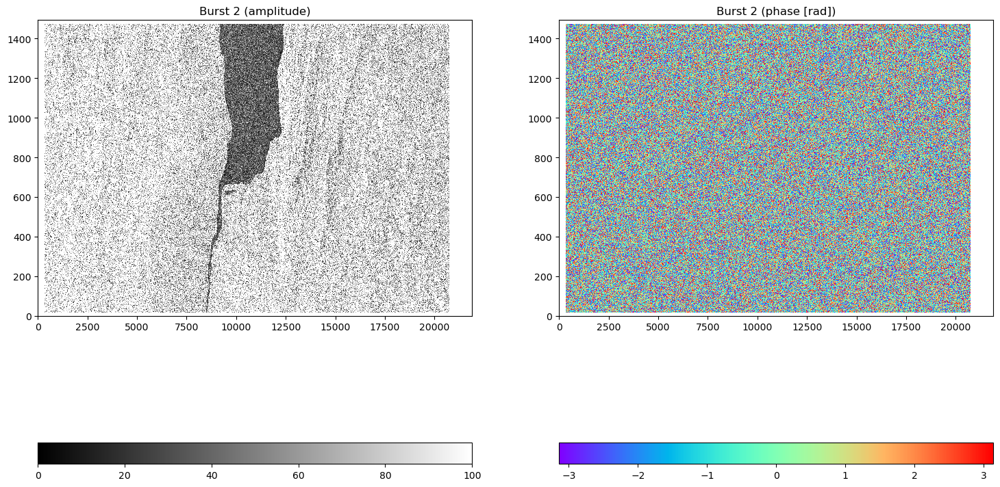

In [10]:
plotcomplexdata('./reference/overlaps/IW1/burst_bot_01_02.slc.vrt',
                title='bot_01_02 (from Burst 2)',
                aspect=10, datamin=0, datamax=100)
plotcomplexdata('./reference/overlaps/IW1/burst_top_01_02.slc.vrt',
                title='top_01_02 (from Burst 1)',
                aspect=10, datamin=0, datamax=100)
plotcomplexdata('./reference/IW1/burst_01.slc.vrt',
                title='Burst 1',
                aspect=10, datamin=0, datamax=100)
plotcomplexdata('./reference/IW1/burst_02.slc.vrt',
                title='Burst 2', aspect=10,
                datamin=0,datamax=100,
                draw_colorbar=True,
                colorbar_orientation="horizontal")

In [23]:
!ls coarse_interferograms/20230109_20230121/overlap/IW3

int_bot_01_02.int      int_bot_06_07.int.vrt  int_top_03_04.int.xml
int_bot_01_02.int.vrt  int_bot_06_07.int.xml  int_top_04_05.int
int_bot_01_02.int.xml  int_bot_07_08.int      int_top_04_05.int.vrt
int_bot_02_03.int      int_bot_07_08.int.vrt  int_top_04_05.int.xml
int_bot_02_03.int.vrt  int_bot_07_08.int.xml  int_top_05_06.int
int_bot_02_03.int.xml  int_bot_08_09.int      int_top_05_06.int.vrt
int_bot_03_04.int      int_bot_08_09.int.vrt  int_top_05_06.int.xml
int_bot_03_04.int.vrt  int_bot_08_09.int.xml  int_top_06_07.int
int_bot_03_04.int.xml  int_top_01_02.int      int_top_06_07.int.vrt
int_bot_04_05.int      int_top_01_02.int.vrt  int_top_06_07.int.xml
int_bot_04_05.int.vrt  int_top_01_02.int.xml  int_top_07_08.int
int_bot_04_05.int.xml  int_top_02_03.int      int_top_07_08.int.vrt
int_bot_05_06.int      int_top_02_03.int.vrt  int_top_07_08.int.xml
int_bot_05_06.int.vrt  int_top_02_03.int.xml  int_top_08_09.int
int_bot_05_06.int.xml  int_top_03_04.int      int_top_08_09.int.vrt


['coarse_interferogram/overlaps/IW1/burst_top_02_03.7alks_19rlks.int', 'coarse_interferogram/overlaps/IW1/burst_top_03_04.7alks_19rlks.int', 'coarse_interferogram/overlaps/IW1/burst_top_04_05.7alks_19rlks.int', 'coarse_interferogram/overlaps/IW1/burst_top_01_02.7alks_19rlks.int']


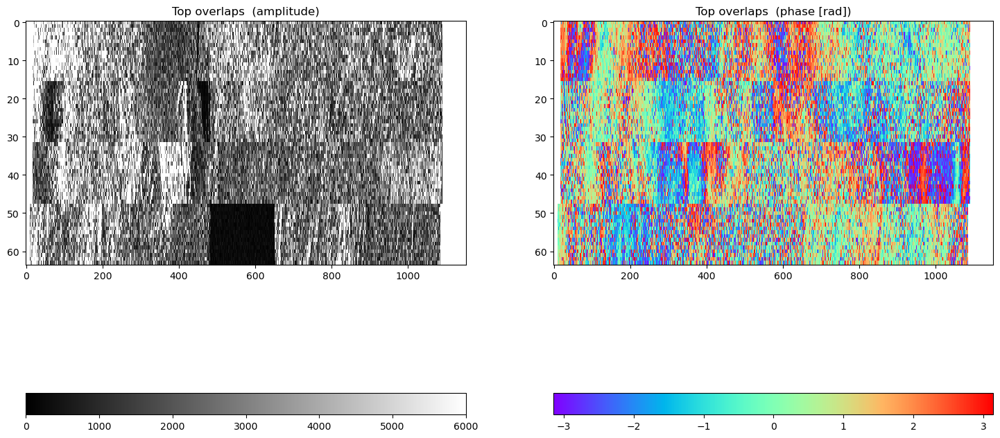

In [13]:
plotstackcomplexdata('coarse_interferogram/overlaps/IW1/burst_top_*.7alks_19rlks.int',
                     title="Top overlaps ", aspect=10, datamin=0, datamax=6000,
                     draw_colorbar=True, colorbar_orientation="horizontal")

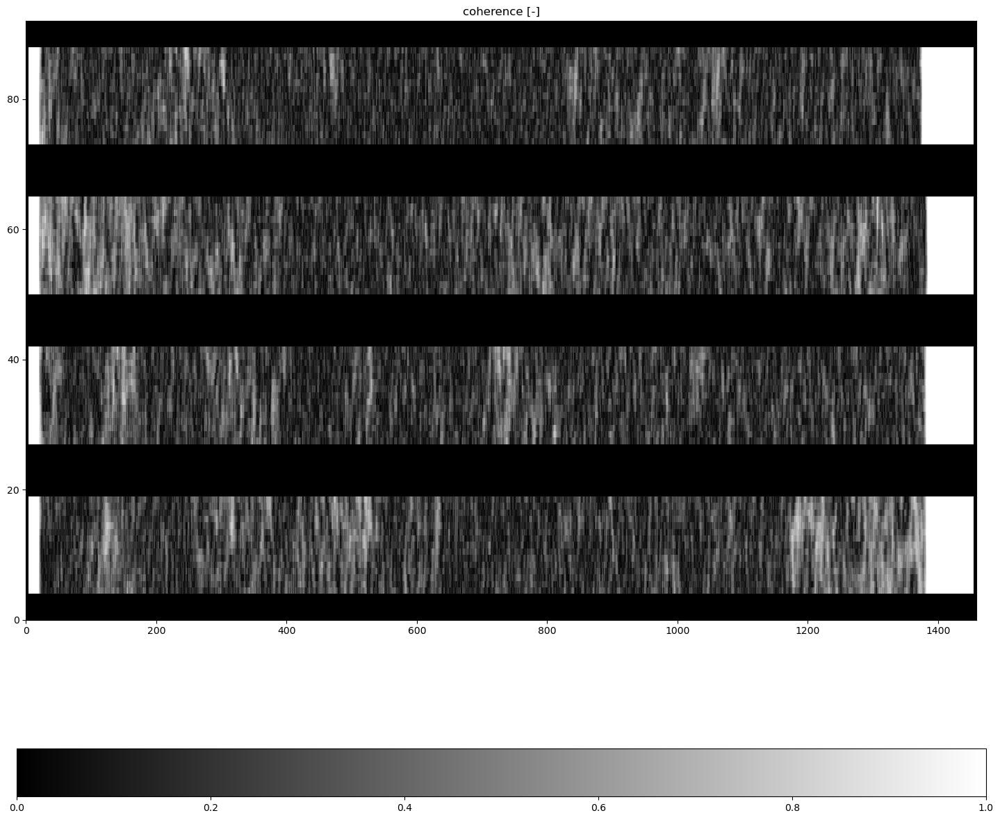

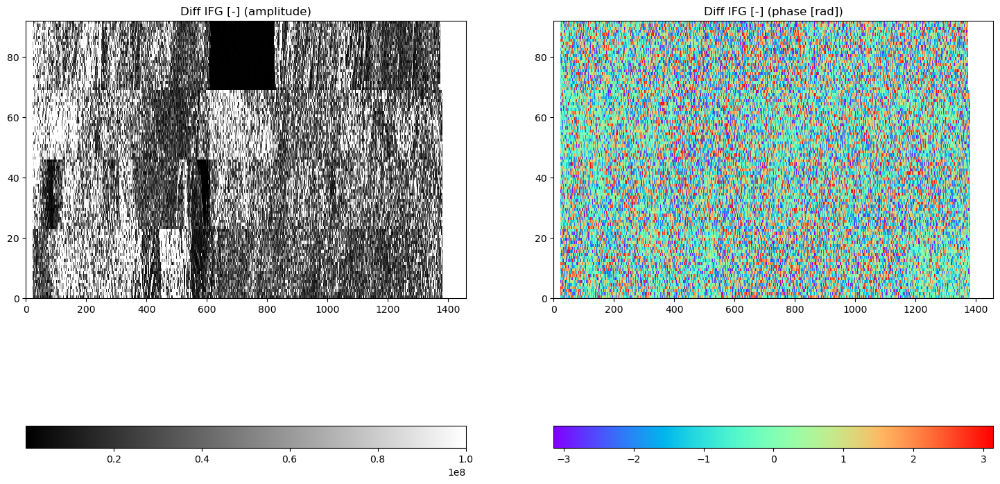

In [15]:
# Plot ESD coherence
plotdata('ESD/combined_IW1.cor', band=1,
         title="coherence [-]", aspect=10,
         datamin=0, datamax=1, background='yes')

# Plot double difference interferogram
plotcomplexdata('ESD/combined_IW1.int',
                title="Diff IFG [-]", aspect=10,
                datamin=100000, datamax=100000000,
                draw_colorbar=True)

/data/tapas/pearse/miniconda3/envs/isce2build/lib/python3.12/site-packages/osgeo/gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


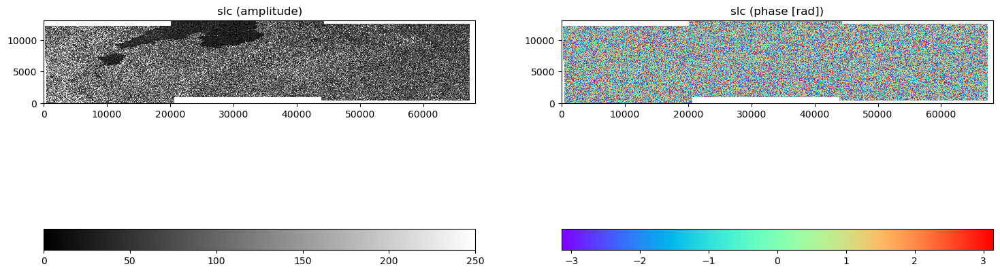

In [5]:
# GDALfilename = "/data/tapas/pearse/malawi/SSM/malawi_InSAR_SSM_1km_southern_20230101_20230531/malawi_InSAR_SSM_1km_southern_20230101_20230531/INSAR4SM_processing/slcs/20230109.vrt"
# GDAL_full = "merged/SLC/20230109/20230109.slc.full.vrt"
GDALfilename = "/data/tapas/pearse/malawi/SSM/malawi_InSAR_SSM_5km_20230101_20240531/malawi_InSAR_SSM_5km_20230101_20240531/INSAR4SM_datasets/slcs/20230109.vrt"
plotcomplexdata(GDALfilename, "slc", datamin=0, datamax=250, draw_colorbar=True)

['fine_interferogram/IW1/burst_05.7alks_19rlks.int.vrt', 'fine_interferogram/IW1/burst_02.7alks_19rlks.int.vrt', 'fine_interferogram/IW1/burst_04.7alks_19rlks.int.vrt', 'fine_interferogram/IW1/burst_01.7alks_19rlks.int.vrt', 'fine_interferogram/IW1/burst_03.7alks_19rlks.int.vrt']


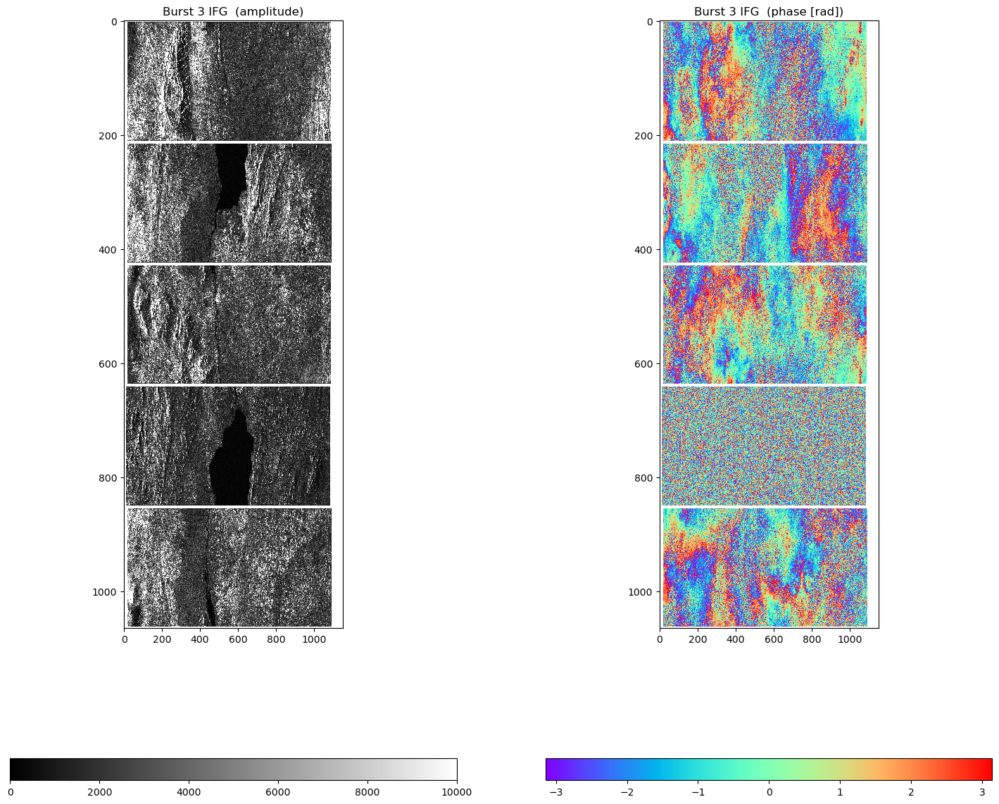

In [17]:
plotstackcomplexdata('fine_interferogram/IW1/burst_0*.7alks_19rlks.int.vrt', 
                title="Burst 3 IFG ", aspect=3, datamin=0, datamax=10000,
                draw_colorbar=True)

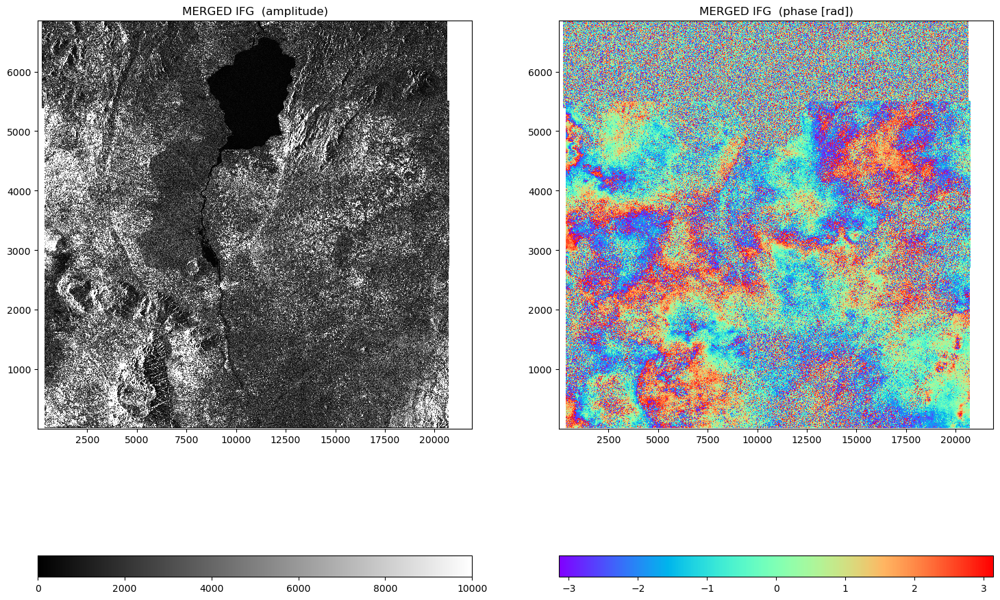

In [18]:
plotcomplexdata('merged/topophase.flat.vrt', 
                title="MERGED IFG ", aspect=3,
                datamin=0, datamax=10000, draw_colorbar=True)

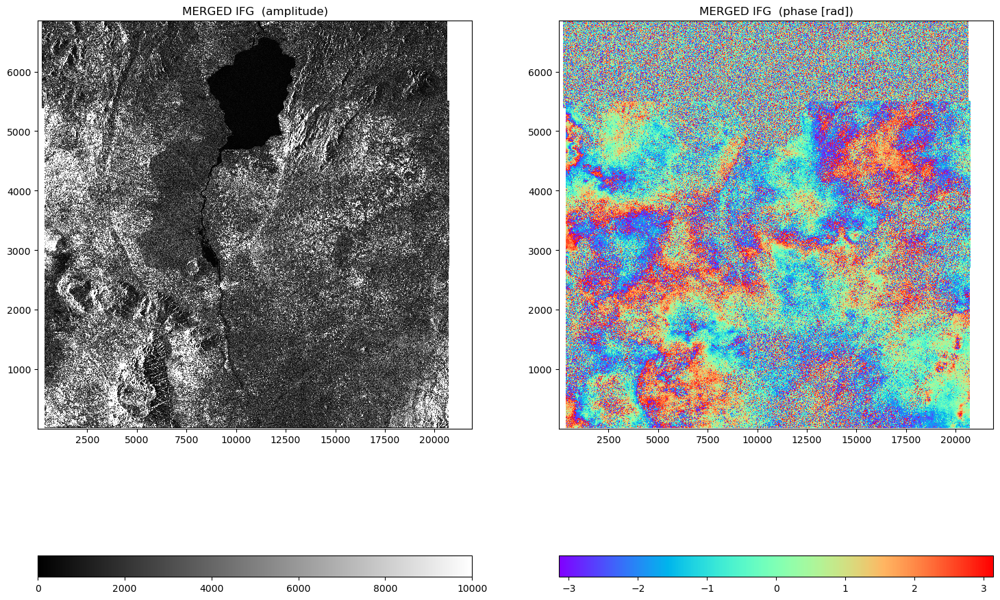

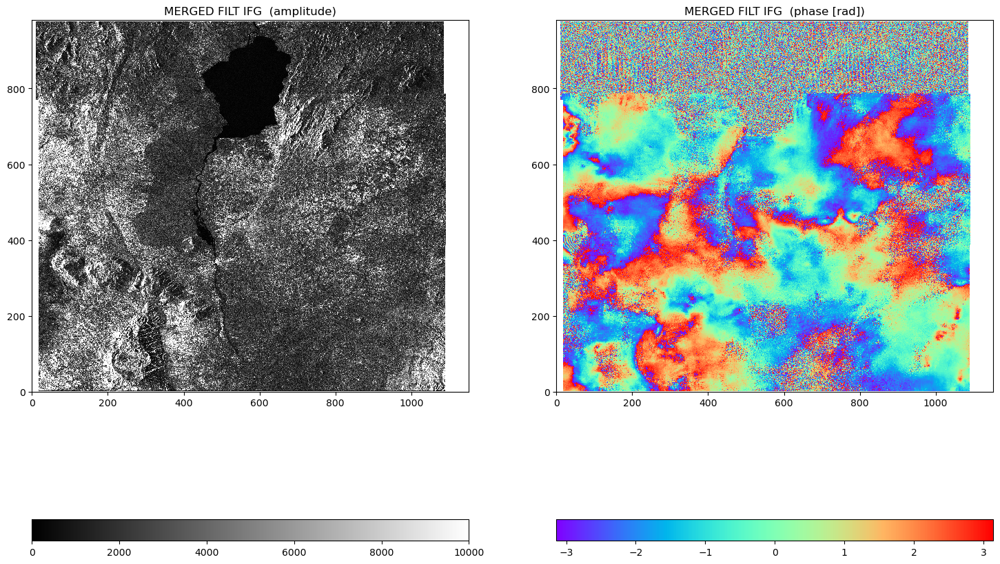

In [19]:
plotcomplexdata('merged/topophase.flat.vrt',
                title="MERGED IFG ", aspect=3,
                datamin=0, datamax=10000, draw_colorbar=True)
plotcomplexdata('merged/filt_topophase.flat.vrt', 
                title="MERGED FILT IFG ", aspect=1,
                datamin=0, datamax=10000, draw_colorbar=True)



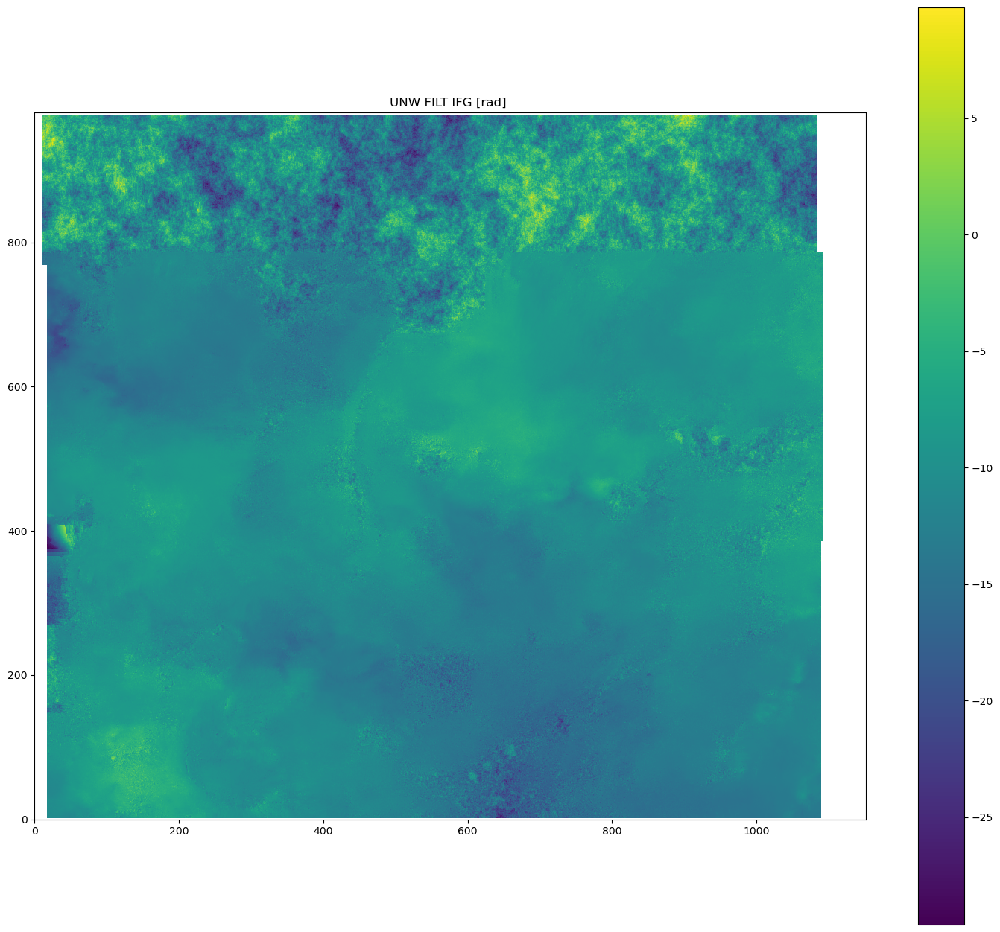

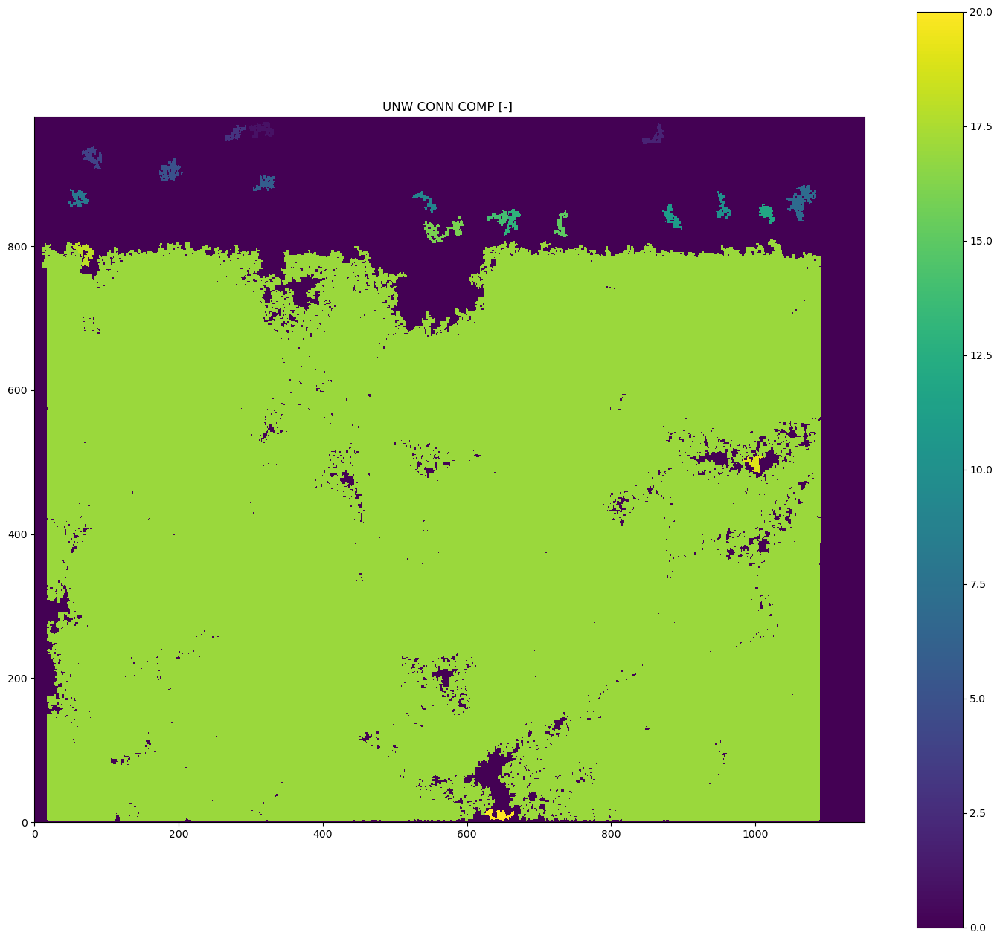

In [22]:


plotdata('merged/filt_topophase.unw', band=2,
         title="UNW FILT IFG [rad] ",
         colormap='viridis', colorbar_orientation="vertical")

plotdata('merged/filt_topophase.unw.conncomp', band=1,
         title="UNW CONN COMP [-] ", colormap='viridis',
         colorbar_orientation="vertical",
         nodata=0)



In [72]:
GDAL_georef_file = "/data/tapas/pearse/malawi/sentinel1/stack_full_frame/merged/SLC/20230121/20230121.slc.full.geo"
ds = gdal.Open(GDAL_georef_file, gdal.GA_ReadOnly)
slc_arr = ds.GetRasterBand(1).ReadAsArray()

In [77]:
slc = ds.GetRasterBand(1)

In [78]:
slc.

<osgeo.gdal.Band; proxy of <Swig Object of type 'GDALRasterBandShadow *' at 0x738c5cfa2940> >

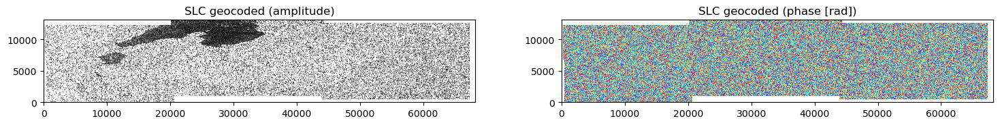

In [82]:
plotcomplexdata('/data/tapas/pearse/malawi/sentinel1/stack_full_frame/merged/SLC/20230121/20230121.slc.full',
         title="SLC geocoded",
         colorbar_orientation="horizontal", datamin=0, datamax=100)
# plotcomplexdata('/data/tapas/pearse/malawi/sentinel1/stack_full_frame/merged/SLC/20230121/20230121.slc.full.geo',
#          title="SLC geocoded",
#          colorbar_orientation="horizontal", draw_colorbar=True, datamin=0, datamax=100)


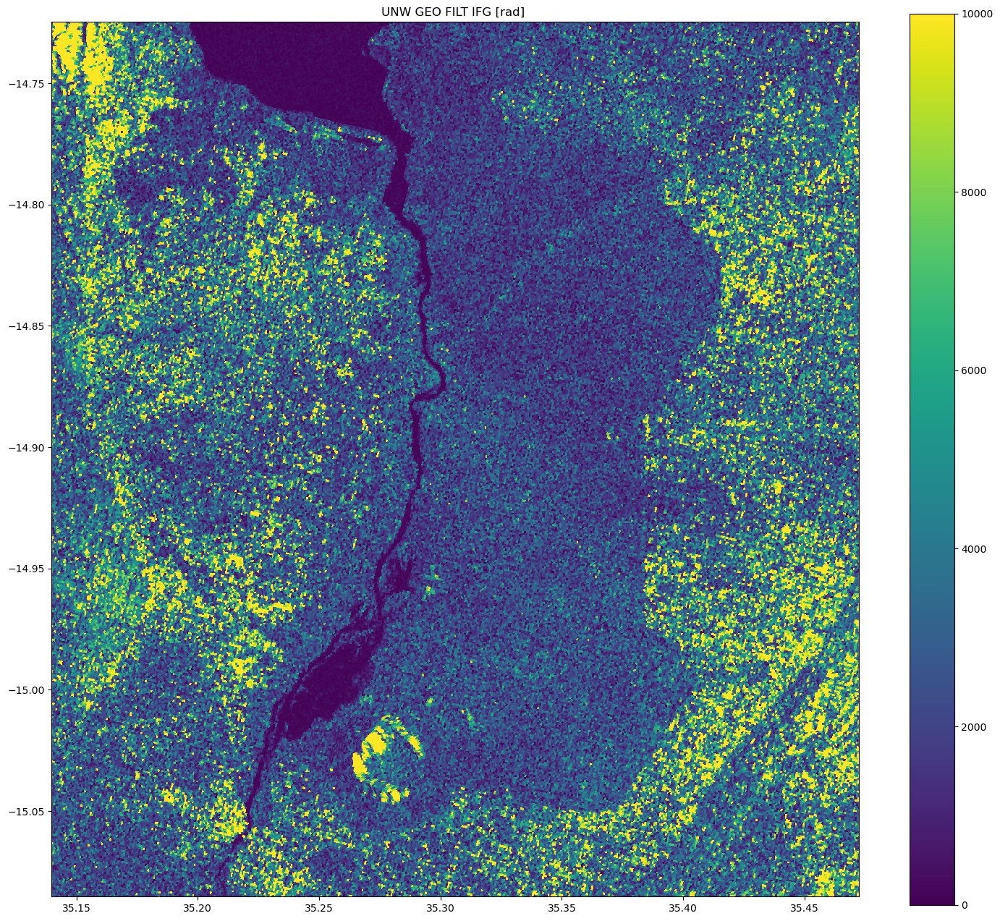

In [36]:
plotdata('merged/filt_topophase.unw.geo', band=1,
         title="UNW GEO FILT IFG [rad] ", colormap='viridis',
         colorbar_orientation="vertical", datamin=0, datamax=10000)

In [ ]:
os.chdir("/data/tapas/pearse")
tutorial_home_dir = os.getcwd()
print("Notebook directory: ", tutorial_home_dir)

# directory for data downloads
slc_dir = os.path.join(tutorial_home_dir,'malawi', 'sentinel1', 'SLC')
orbit_dir = os.path.join(tutorial_home_dir, 'malawi', 'sentinel1' 'orbit_dir')
insar_dir = os.path.join(tutorial_home_dir, 'malawi', 'sentinel1', 'insar')
os.makedirs(insar_dir, exist_ok=True)

In [ ]:
def configure_inputs(outDir):
    """Write an XML Parameter file for topsApp.py """
    
    cmd_topsApp_config ='''<?xml version="1.0" encoding="UTF-8"?>
<topsApp>
  <component name="topsinsar">
    <property name="Sensor name">SENTINEL1</property>
    <component name="reference">
        <catalog>reference.xml</catalog>
    </component>
    <component name="secondary">
        <catalog>secondary.xml</catalog>
    </component>
    <!--<property name="swaths">[1,2,3]</property>-->
    <property name="range looks">7</property>
    <property name="azimuth looks">3</property>
    <property name="region of interest">[-13.705,-13.608,33.821,33.915]</property>
    <property name="do unwrap">True</property>
    <property name="unwrapper name">snaphu_mcf</property>
    <property name="do denseoffsets">True</property>
    <property name="use gpu">True</property>
    <property name="ESD coherence threshold">0.85</property>
    <!--<property name="demfilename">/data/tapas/pearse/malawi/sentinel1/DEM/demLat_S16_S11_Lon_E031_E036.dem.wgs84</property>-->
    <!--<property name="geocode demfilename">/data/tapas/pearse/malawi/sentinel1/DEM/demLat_S16_S11_Lon_E031_E036.dem.wgs84</property>-->
    <!--property name="geocode list">['merged/phsig.cor', 'merged/filt_topophase.unw', 'merged/los.rdr', 'merged/topophase.flat', 'merged/filt_topophase.flat','merged/topophase.cor','merged/filt_topophase.unw.conncomp']</property>-->
  </component>
</topsApp>'''
    print("writing topsApp.xml")
    with open(os.path.join(outDir,"topsApp.xml"), "w") as fid:
        fid.write(cmd_topsApp_config)
        
    cmd_reference_config = '''<component name="reference">
    <property name="orbit directory">/data/tapas/pearse/malawi/sentinel1/orbit_dir</property>
    <property name="output directory">reference</property>
    <property name="safe">['/data/tapas/pearse/malawi/sentinel1/SLC/S1A_IW_SLC__1SDV_20240409T031608_20240409T031635_053351_067832_CAAF.zip']</property>
</component>'''
    print("writing reference.xml")
    with open(os.path.join(outDir,"reference.xml"), "w") as fid:
        fid.write(cmd_reference_config)
        
    cmd_secondary_config = '''<component name="secondary">
    <property name="orbit directory">/data/tapas/pearse/malawi/sentinel1/orbit_dir</property>
    <property name="output directory">secondary</property>
    <property name="safe">['/data/tapas/pearse/malawi/sentinel1/SLC/S1A_IW_SLC__1SDV_20240421T031608_20240421T031635_053526_067F19_39FF.zip']</property>
</component>'''
    print("writing secondary.xml")
    with open(os.path.join(outDir,"secondary.xml"), "w") as fid:
        fid.write(cmd_secondary_config)

In [ ]:
configure_inputs(insar_dir)

In [ ]:
os.chdir(insar_dir)

In [ ]:
!topsApp.py --dostep=startup &> startup.log

In [ ]:
!tail startup.log

In [ ]:
!topsApp.py --dostep=preprocess &> preprocess.log
!tail preprocess.log

In [ ]:
!topsApp.py --dostep=computeBaselines &> computeBaselines.log
!tail computeBaselines.log

In [ ]:
!topsApp.py --dostep=verifyDEM &> verifyDEM.log
!tail verifyDEM.log

In [ ]:
!topsApp.py --dostep=topo &>  topo.log
!tail topo.log

In [ ]:
!gdalinfo -stats geom_reference/IW3/los_02.rdr.vrt

In [ ]:
path = 'geom_reference/hgt.rdr'
da =rxr.open_rasterio(path, parse_coordinates=False)

plt.imshow(da.sel(band=1), aspect=1)
plt.title(path)
plt.xlabel('Range (pixel)')
plt.ylabel('Azimuth (pixel')

cb = plt.colorbar(orientation='horizontal', shrink=0.5);
cb.set_label('Elevation (m)')

In [ ]:
path = 'geom_reference/los.rdr'
da =rxr.open_rasterio(path, parse_coordinates=False)

plt.imshow(da.sel(band=1), aspect=1)
plt.title(path)
plt.xlabel('Range (pixel)')
plt.ylabel('Azimuth (pixel')

cb = plt.colorbar(orientation='horizontal', shrink=0.5);
cb.set_label('Incidence (degrees)')

In [ ]:
path = 'geom_reference/los.rdr'
da =rxr.open_rasterio(path, parse_coordinates=False)

plt.imshow(da.sel(band=2), aspect=1)
plt.title(path)
plt.xlabel('Range (pixel)')
plt.ylabel('Azimuth (pixel')

cb = plt.colorbar(orientation='horizontal', shrink=0.5);
cb.set_label('Azimuth Angle (degrees)')

In [ ]:
!topsApp.py --start=subsetoverlaps --end=esd &> subsetoverlaps.log
!tail subsetoverlaps.log

In [ ]:
plotcomplexdata('reference/overlaps/IW3/burst_bot_01_02.slc.vrt',
                title='bot_01_02 (from Burst 2)',
                aspect=10, datamin=0, datamax=200)
plotcomplexdata('reference/overlaps/IW3/burst_top_01_02.slc.vrt',
                title='top_01_02 (from Burst 1)',
                aspect=10, datamin=0, datamax=200)
plotcomplexdata('reference/IW3/burst_01.slc.vrt',
                title='Burst 1',
                aspect=10, datamin=0, datamax=200)
plotcomplexdata('reference/IW3/burst_02.slc.vrt',
                title='Burst 2', aspect=10,
                datamin=0,datamax=200,
                draw_colorbar=True,
                colorbar_orientation="horizontal")

In [ ]:
!topsApp.py --dostep=coarseoffsets &> coarseoffsets.log
!tail coarseoffsets.log

In [ ]:
plotdata('coarse_offsets/overlaps/IW3/azimuth_bot_01_02.off.vrt', band=1,
            title='Azimuth bot_01_02', colormap='gray', aspect=10,
            nodata=-999999,
           )

In [ ]:
plotdata('coarse_offsets/overlaps/IW3/range_bot_01_02.off.vrt', band=1,
            title='Range bot_01_02', colormap='gray', aspect=10,
             nodata=-999999,
           )

In [ ]:
!gdal_translate -a_nodata -999999.0 coarse_offsets/overlaps/IW3/azimuth_bot_01_02.off.vrt stats.vrt
!gdalinfo -stats stats.vrt

In [ ]:
!topsApp.py --dostep=coarseresamp &> coarseresamp.log
!tail coarseresamp.log

In [ ]:
!topsApp.py --dostep=overlapifg &> overlap.log
!tail overlap.log

In [ ]:
plotstackcomplexdata('coarse_interferogram/overlaps/IW3/burst_top_*.3alks_7rlks.int',
                     title="Top overlaps ", aspect=10, datamin=0, datamax=6000,
                     draw_colorbar=True, colorbar_orientation="horizontal")

In [ ]:
!topsApp.py --dostep=prepesd &> prepesd.log
!tail prepesd.log

In [ ]:
!topsApp.py --dostep=esd &> esd.log
!tail esd.log

In [ ]:
# Plot ESD coherence
plotdata('ESD/combined_IW3.cor', band=1,
         title="coherence [-]", aspect=10,
         datamin=0, datamax=1, background='yes')

# Plot double difference interferogram
plotcomplexdata('ESD/combined_IW3.int',
                title="Diff IFG [-]", aspect=10,
                datamin=100000, datamax=100000000,
                draw_colorbar=True)

In [ ]:
!topsApp.py --dostep=rangecoreg  &> rangecoreg.log
!tail rangecoreg.log

In [ ]:
!topsApp.py --start=fineoffsets --end=fineresamp &> fineoffsets.log
!tail fineoffsets.log

In [ ]:
!topsApp.py --dostep=fineresamp &> fineresamp.log
!tail fineresamp.log

In [ ]:
!topsApp.py --start=burstifg --end=filter &> burstifg.log
!tail burstifg.log

In [ ]:
!topsApp.py --dostep=unwrap &> unwrap.log
!tail unwrap.log